### Thêm thư viện

In [78]:
import numpy as np
from skimage import img_as_float, img_as_ubyte, exposure
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pylab as pylab

In [79]:
def plot_image(image, title=''):
    pylab.title(title, size=15), pylab.imshow(image)
    pylab.axis('off') #tắt trục toạ độ x, y

def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    pylab.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    pylab.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    pylab.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    pylab.xlabel('pixel value', size=12), pylab.ylabel('frequency', size=12)
    pylab.title(title, size=15)

### Biến đổi logarit

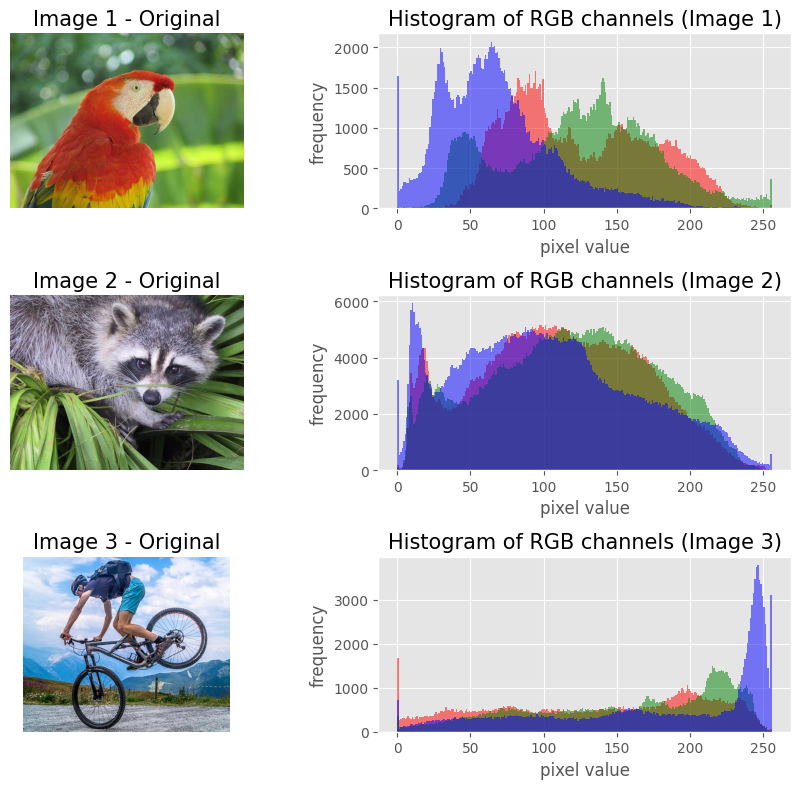

In [80]:
# Load 3 images
image_paths = ["../images/parrot.png", "../images/face.png", "../images/cycle.jpg"]
images = [Image.open(path) for path in image_paths]

pylab.style.use('ggplot')
pylab.figure(figsize=(9, 8))

for idx, img in enumerate(images):
    img_r, img_g, img_b = img.split()
    # Plot image
    pylab.subplot(len(images), 2, idx * 2 + 1)
    plot_image(img, f'Image {idx + 1} - Original')
    # Plot histogram
    pylab.subplot(len(images), 2, idx * 2 + 2)
    plot_hist(img_r, img_g, img_b, f'Histogram of RGB channels (Image {idx + 1})')

pylab.tight_layout()
pylab.show()

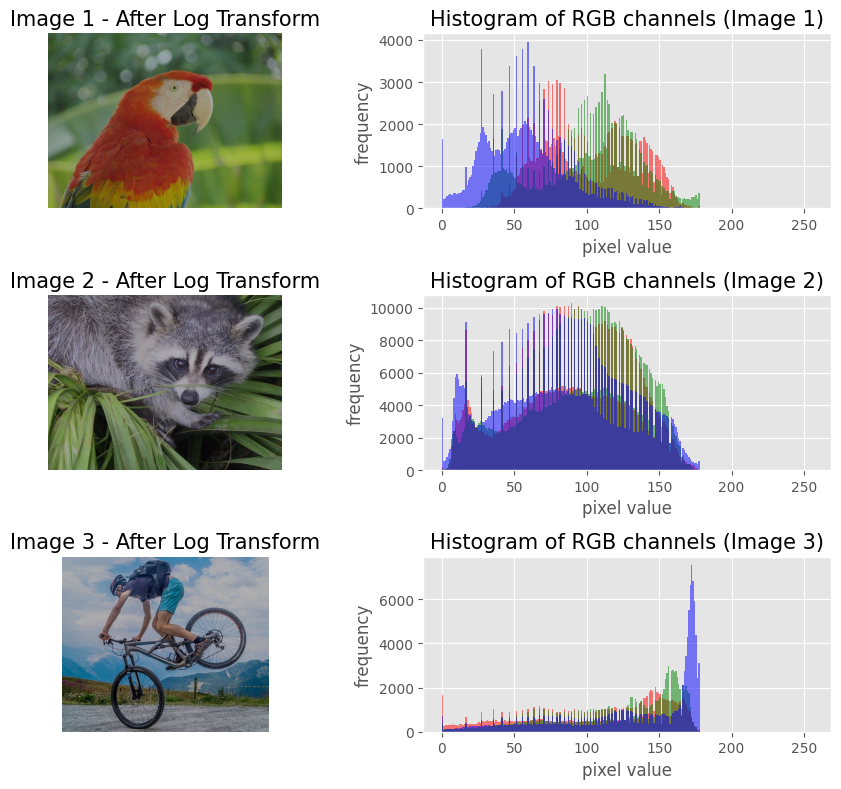

In [81]:
pylab.style.use('ggplot')
pylab.figure(figsize=(9, 8))

for idx, img in enumerate(images):
    # Apply log transform
    img_log = img.point(lambda i: 255 * np.log(1 + i / 255))
    img_r, img_g, img_b = img_log.split()
    
    # Plot log-transformed image
    pylab.subplot(len(images), 2, idx * 2 + 1)
    plot_image(img_log, f'Image {idx + 1} - After Log Transform')
    
    # Plot histogram
    pylab.subplot(len(images), 2, idx * 2 + 2)
    plot_hist(img_r, img_g, img_b, f'Histogram of RGB channels (Image {idx + 1})')

pylab.tight_layout()
pylab.show()

### Biến đổi hàm mũ

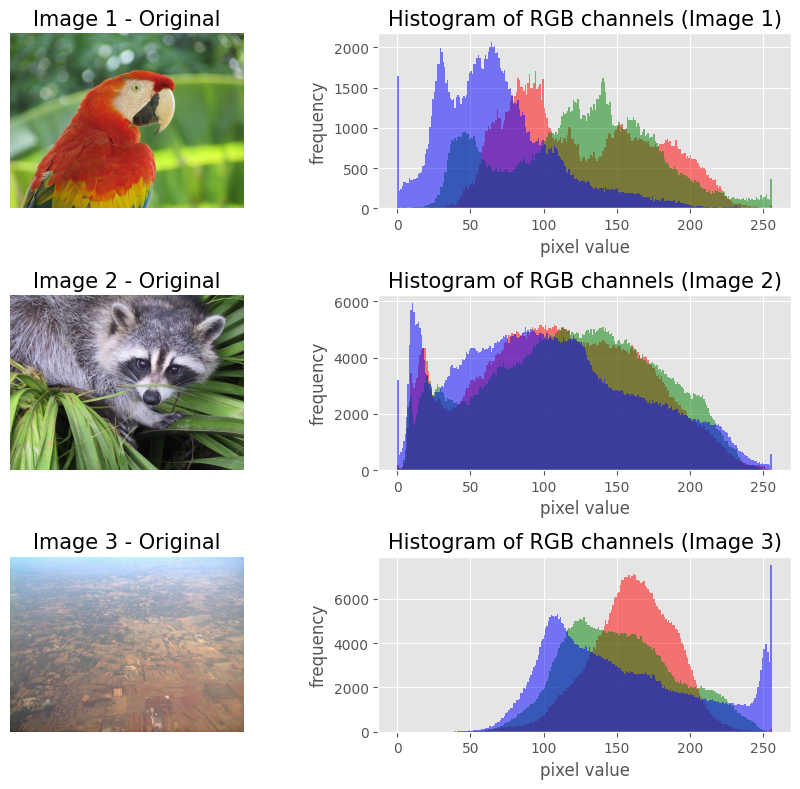

In [82]:
# Load 3 images
image_paths = ["../images/parrot.png", "../images/face.png", "../images/earthfromsky.jpg"]
images = [Image.open(path) for path in image_paths]

pylab.style.use('ggplot')
pylab.figure(figsize=(9, 8))

for idx, img in enumerate(images):
    img_r, img_g, img_b = img.split()
    # Plot image
    pylab.subplot(len(images), 2, idx * 2 + 1)
    plot_image(img, f'Image {idx + 1} - Original')
    # Plot histogram
    pylab.subplot(len(images), 2, idx * 2 + 2)
    plot_hist(img_r, img_g, img_b, f'Histogram of RGB channels (Image {idx + 1})')

pylab.tight_layout()
pylab.show()

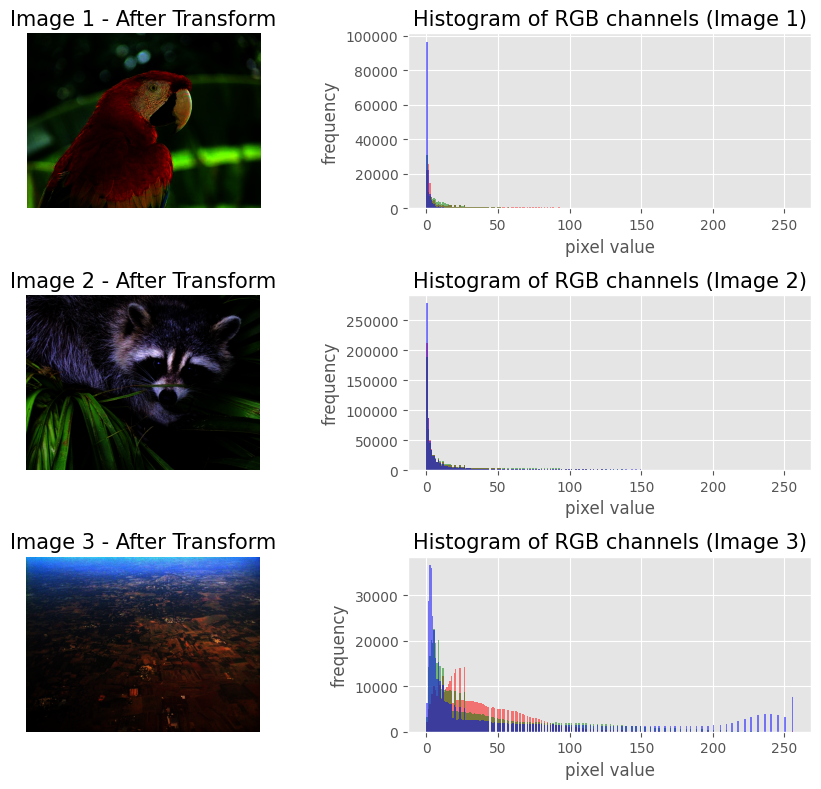

In [83]:
pylab.style.use('ggplot')
pylab.figure(figsize=(9, 8))

for idx, img in enumerate(image_paths):
    img_power = img_as_float(imread(img))
    gamma = 5
    img_power **= 5
    
    # Plot log-transformed image
    pylab.subplot(len(images), 2, idx * 2 + 1)
    plot_image(img_power, f'Image {idx + 1} - After Transform')
    
    # Plot histogram
    pylab.subplot(len(images), 2, idx * 2 + 2)
    plot_hist(img_power[..., 0], img_power[..., 1], img_power[..., 2], f'Histogram of RGB channels (Image {idx + 1})')

pylab.tight_layout()
pylab.show()

### Kéo giãn độ tương phản với PIL như một phép biến đổi điểm

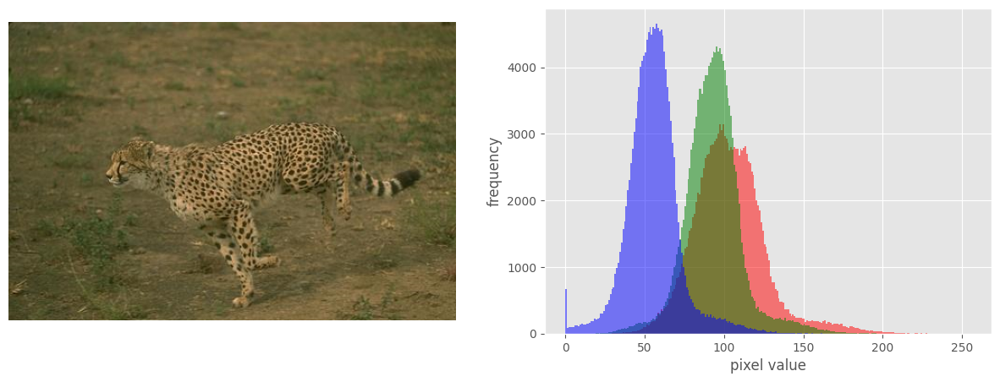

In [84]:
im = Image.open('../images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.show()

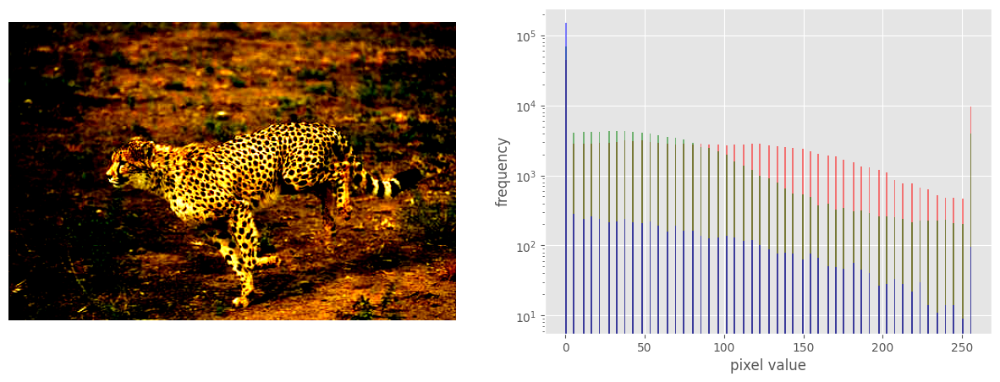

In [85]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im1 = im.point(contrast)
im_r, im_g, im_b, _ = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im1)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.yscale('log',base=10)
pylab.show()

### Contrast stretching Using the PIL ImageEnhance module

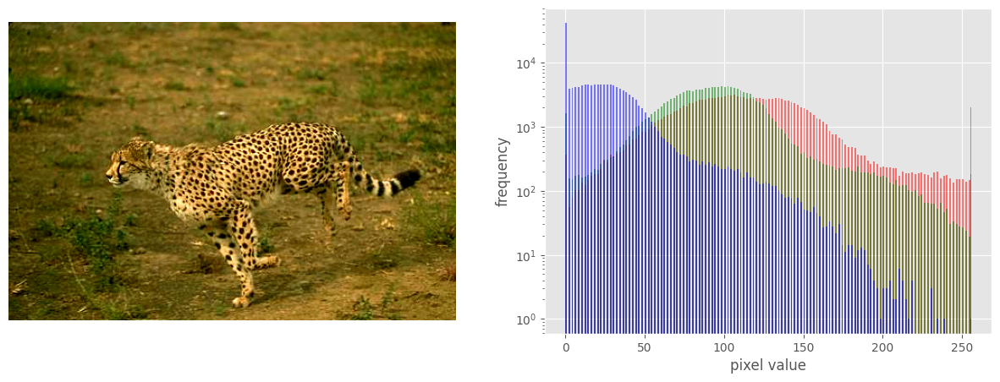

In [86]:
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im1)
pylab.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2]), pylab.yscale('log',base=10)
pylab.show()

### Phân ngưỡng sử dụng ngưỡng cố định

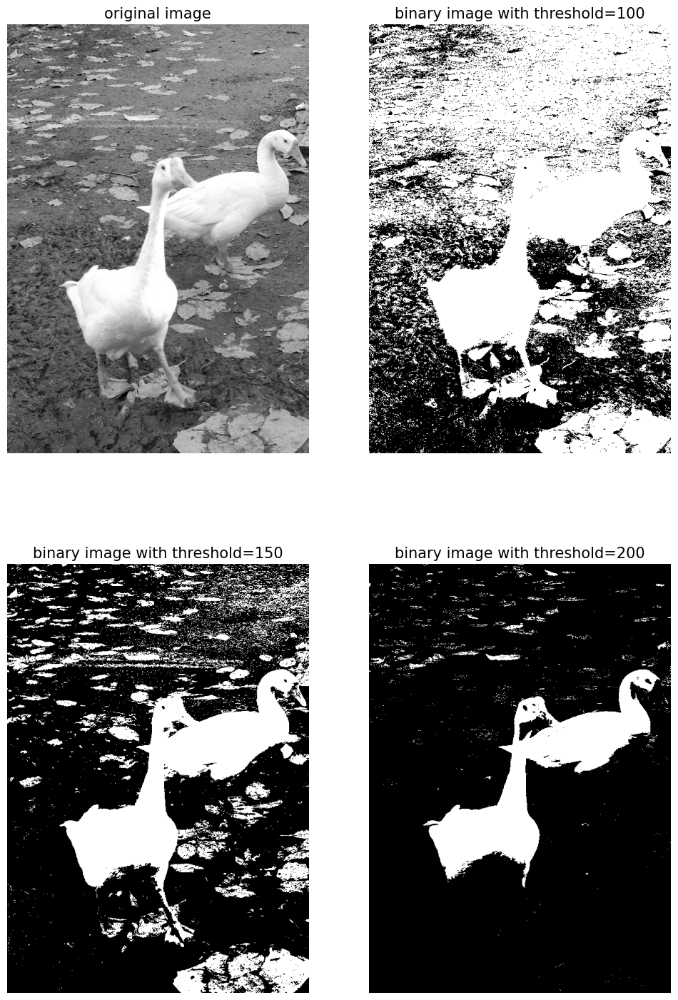

In [87]:
im = Image.open('../images/swans.jpg').convert('L')

pylab.figure(figsize=(12,18))
pylab.gray()
pylab.subplot(221), plot_image(im, 'original image'), pylab.axis('off')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' + str(th[i]))
pylab.show()

### Half-toning

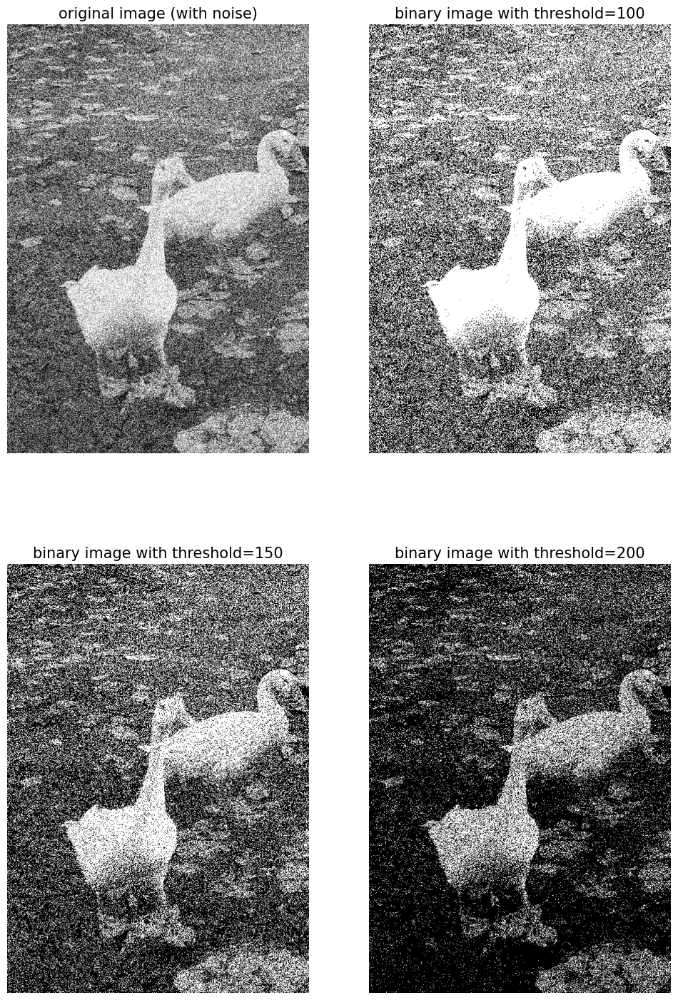

In [88]:
im = Image.open('../images/swans.jpg').convert('L')
im = Image.fromarray(np.clip(im + np.random.randint(-128, 128, (im.height, im.width)), 0, 255).astype(np.uint8))
pylab.figure(figsize=(12,18))
pylab.subplot(221), plot_image(im, 'original image (with noise)')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' +   str(th[i]))
pylab.show()

### Cân bằng histogram 

<Figure size 640x480 with 0 Axes>

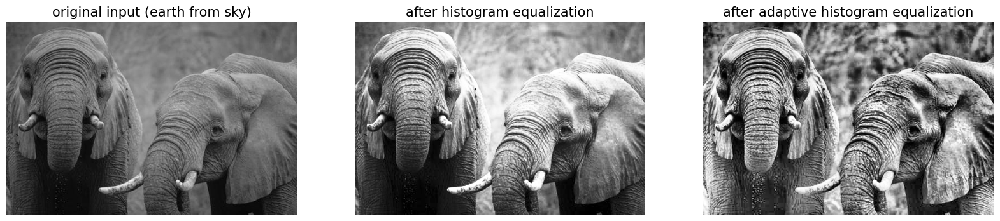

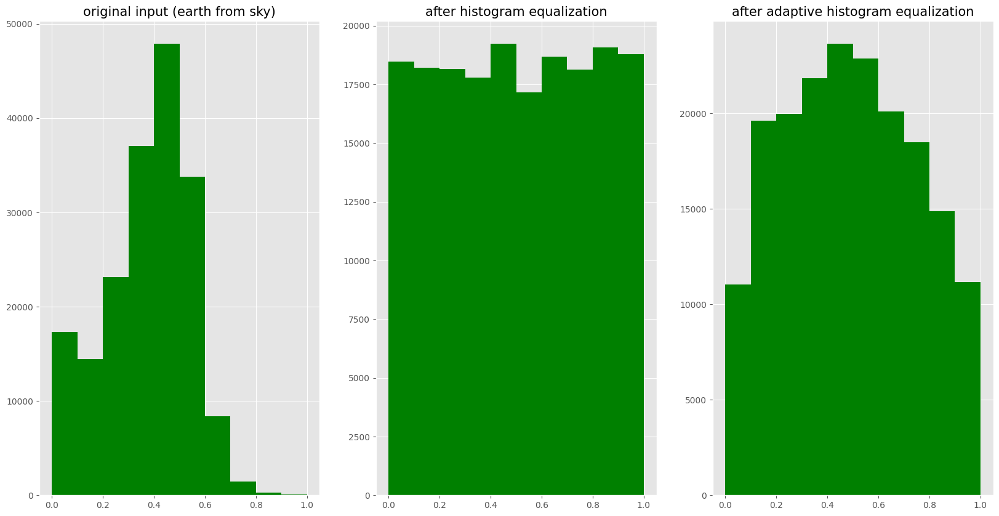

In [89]:
img = rgb2gray(imread('../images/elephant_g.jpg')) 

# histogram equalization
img_eq = exposure.equalize_hist(img)

# adaptive histogram equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
pylab.gray()
images = [img, img_eq, img_adapteq]
titles = ['original input (earth from sky)', 'after histogram equalization', 'after adaptive histogram equalization']
pylab.figure(figsize=(20, 10))
for i in range(3):
    pylab.subplot(1,3,i+1), plot_image(images[i], titles[i])
pylab.figure(figsize=(20, 10))
for i in range(3):
    pylab.subplot(1,3,i+1), pylab.hist(images[i].ravel(), color='g'), pylab.title(titles[i], size=15)
pylab.show()

### Ghép Histogram

In [90]:
def cdf(im): 
    # Tính CDF của ảnh im dưới dạng 2D numpy ndarray
    c, b = cumulative_distribution(im)
    
     # Thêm các giá trị đầu và cuối cho các pixel và giá trị CDF của chúng
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF của ảnh đầu vào tính bằng hàm cdf()
    c_t: CDF của ảnh mẫu tính bằng hàm cdf()
    im: ảnh đầu vào dưới dạng 2D numpy ndarray
    trả về giá trị pixel đã chỉnh sửa cho ảnh đầu vào
    '''
    pixels = np.arange(256)

    # Tìm các điểm ảnh gần nhất tương ứng với CDF của ảnh đầu vào, dựa trên giá trị của CDF H
    # của ảnh mẫu tại các điểm ảnh tương ứng, sao cho c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im

d:\Document\BTL\xulianh\venv\Lib\site-packages\skimage\_shared\utils.py:438: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

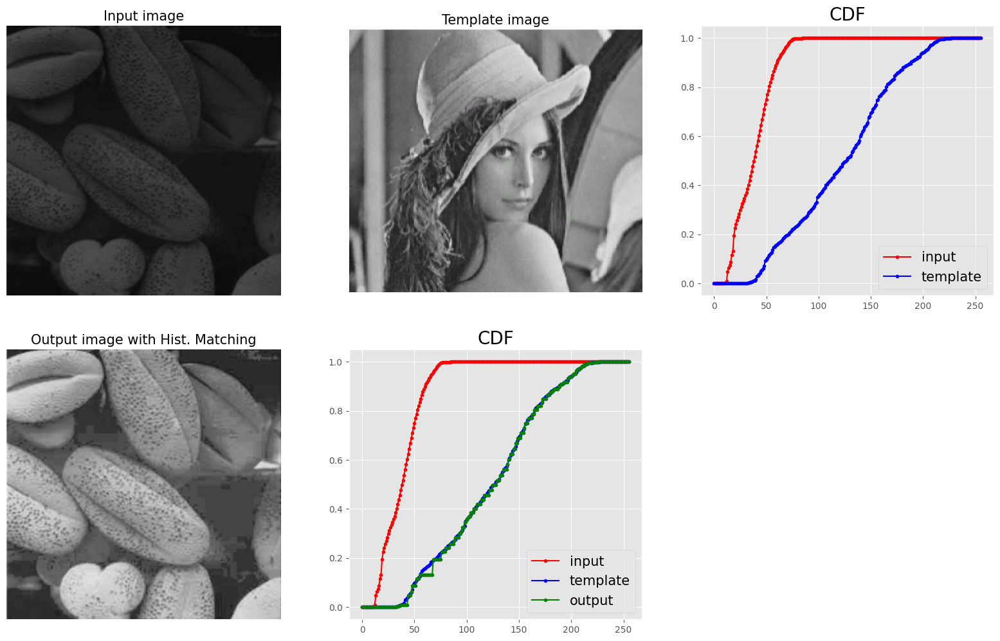

In [91]:
pylab.gray()
im = imread('../images/beans_g.png')[..., :3]  # Đọc ảnh RGB
im_t = imread('../images/lena_g.png')[..., :3]

# Chuyển đổi ảnh sang mức xám sau khi đã đọc đầy đủ kênh màu
im_gray = (rgb2gray(im) * 255).astype(np.uint8)
im_t_gray = (rgb2gray(im_t) * 255).astype(np.uint8)
pylab.figure(figsize=(20,12))
pylab.subplot(2,3,1), plot_image(im, 'Input image')
pylab.subplot(2,3,2), plot_image(im_t, 'Template image')

c = cdf(im)
c_t = cdf(im_t)

pylab.subplot(2,3,3)
p = np.arange(256)
pylab.plot(p, c, 'r.-', label='input')
pylab.plot(p, c_t, 'b.-', label='template')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)

im = hist_matching(c, c_t, im)

pylab.subplot(2,3,4), plot_image(im, 'Output image with Hist. Matching')
c1 = cdf(im)
pylab.subplot(2,3,5)
pylab.plot(np.arange(256), c, 'r.-', label='input')
pylab.plot(np.arange(256), c_t, 'b.-', label='template')
pylab.plot(np.arange(256), c1, 'g.-', label='output')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)
pylab.show()

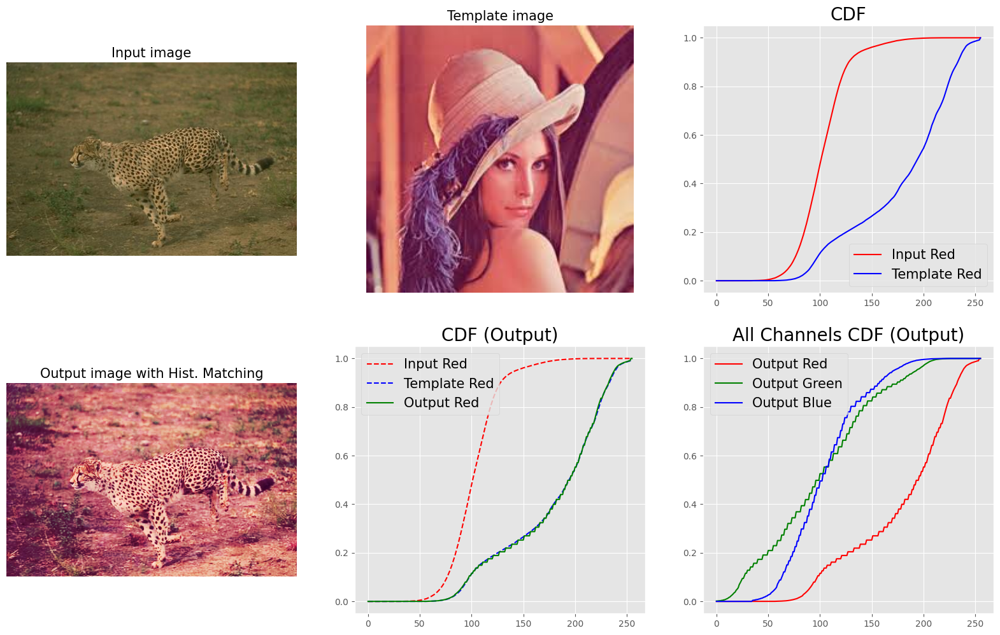

In [92]:
pylab.figure(figsize=(20, 12))

# Đọc ảnh màu
im = imread('../images/cheetah.png')  # Ảnh đầu vào
im_t = imread('../images/lena.jpg')  # Ảnh mẫu

# Chia tách các kênh màu
im_r, im_g, im_b = im[..., 0], im[..., 1], im[..., 2]
im_t_r, im_t_g, im_t_b = im_t[..., 0], im_t[..., 1], im_t[..., 2]

# Tính CDF cho từng kênh màu
c_r, c_t_r = cdf(im_r), cdf(im_t_r)
c_g, c_t_g = cdf(im_g), cdf(im_t_g)
c_b, c_t_b = cdf(im_b), cdf(im_t_b)

# Áp dụng histogram matching trên từng kênh
im_r = hist_matching(c_r, c_t_r, im_r)
im_g = hist_matching(c_g, c_t_g, im_g)
im_b = hist_matching(c_b, c_t_b, im_b)

# Kết hợp lại thành ảnh màu output
im_output = np.stack((im_r, im_g, im_b), axis=-1)

# Tính CDF của ảnh output
c_out_r = cdf(im_r)
c_out_g = cdf(im_g)
c_out_b = cdf(im_b)

# Hiển thị kết quả
pylab.subplot(2, 3, 1), plot_image(im, 'Input image')
pylab.subplot(2, 3, 2), plot_image(im_t, 'Template image')
pylab.subplot(2, 3, 3)
pylab.title('CDF', size=20)
p = np.arange(256)
pylab.plot(p, c_r, 'r-', label='Input Red')
pylab.plot(p, c_t_r, 'b-', label='Template Red')
pylab.legend(prop={'size': 15})

pylab.subplot(2, 3, 4), plot_image(im_output, 'Output image with Hist. Matching')
pylab.subplot(2, 3, 5)
pylab.title('CDF (Output)', size=20)
pylab.plot(p, c_r, 'r--', label='Input Red')
pylab.plot(p, c_t_r, 'b--', label='Template Red')
pylab.plot(p, c_out_r, 'g-', label='Output Red')
pylab.legend(prop={'size': 15})

pylab.subplot(2, 3, 6)
pylab.title('All Channels CDF (Output)', size=20)
pylab.plot(p, c_out_r, 'r-', label='Output Red')
pylab.plot(p, c_out_g, 'g-', label='Output Green')
pylab.plot(p, c_out_b, 'b-', label='Output Blue')
pylab.legend(prop={'size': 15})
pylab.show()

### Bộ lọc trung bình

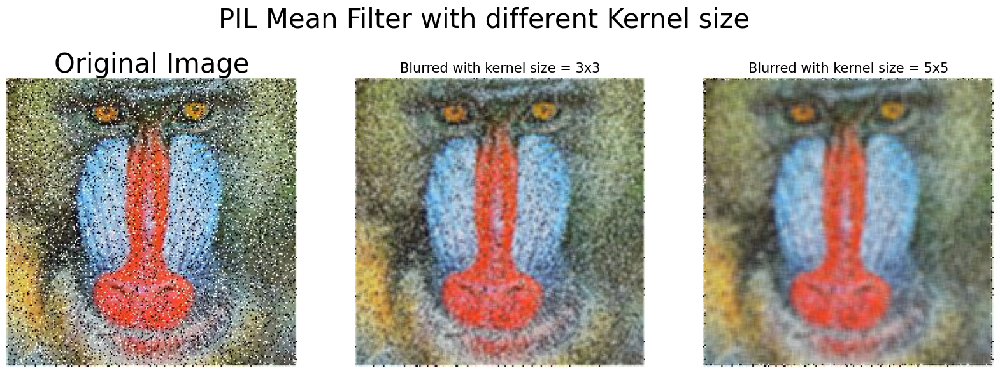

In [93]:
im = Image.open('../images/mandrill_spnoise_0.2.jpg') 
pylab.figure(figsize=(20,7))
pylab.subplot(1,3,1), pylab.imshow(im), pylab.title('Original Image', size=30), pylab.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    pylab.subplot(1,3,(2 if n==3 else 3))
    plot_image(im1, 'Blurred with kernel size = ' + str(n) + 'x' + str(n))
pylab.suptitle('PIL Mean Filter with different Kernel size',
size=30)
pylab.show()

### Bộ lọc Gaussian 

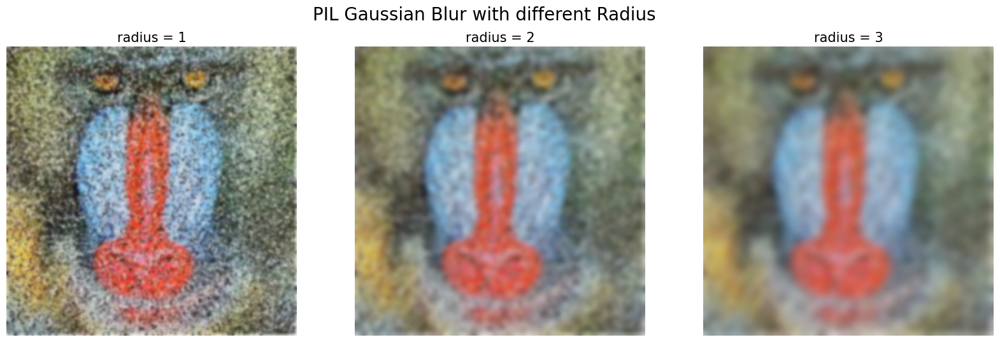

In [94]:
im = Image.open('../images/mandrill_spnoise_0.3.jpg')
pylab.figure(figsize=(20,6))
i = 1
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    pylab.subplot(1,3,i), plot_image(im1, 'radius = ' +
    str(round(radius,2)))
    i += 1
pylab.suptitle('PIL Gaussian Blur with different Radius', size=20)
pylab.show()

### Bộ lọc trung vị 

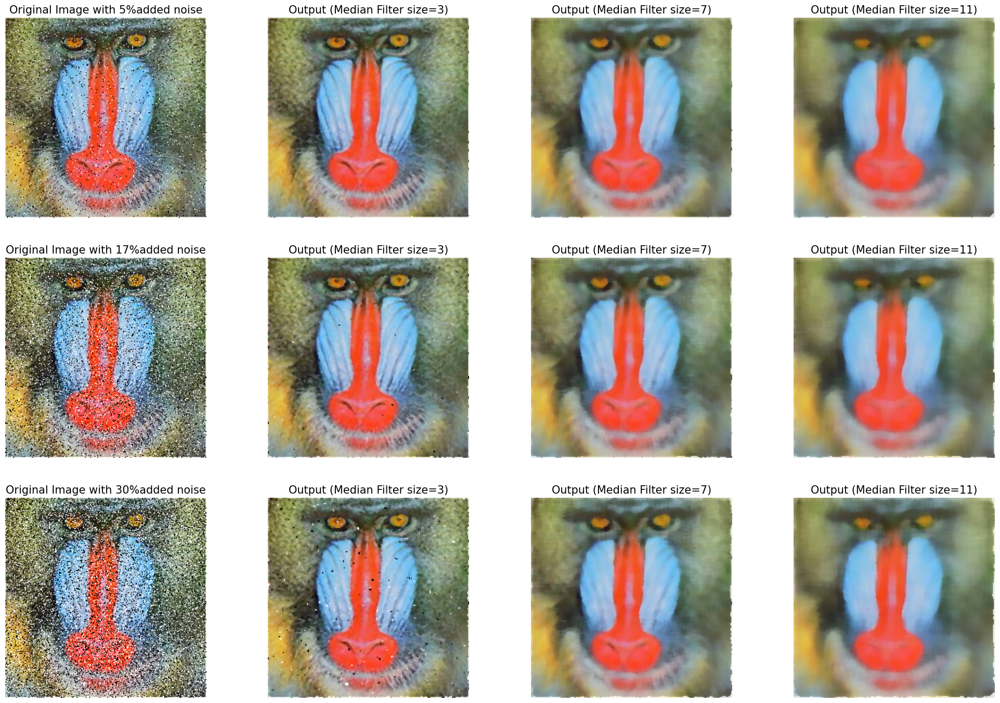

In [95]:
i = 1
pylab.figure(figsize=(25,35))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('../images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6,4,i)
    plot_image(im, 'Original Image with ' + str(int(100*prop_noise)) + '%added noise')
    i += 1
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz))
        pylab.subplot(6,4,i), plot_image(im1, 'Output (Median Filter size=' +  str(sz) + ')')
        i += 1
pylab.show()

### Bộ lọc max/min

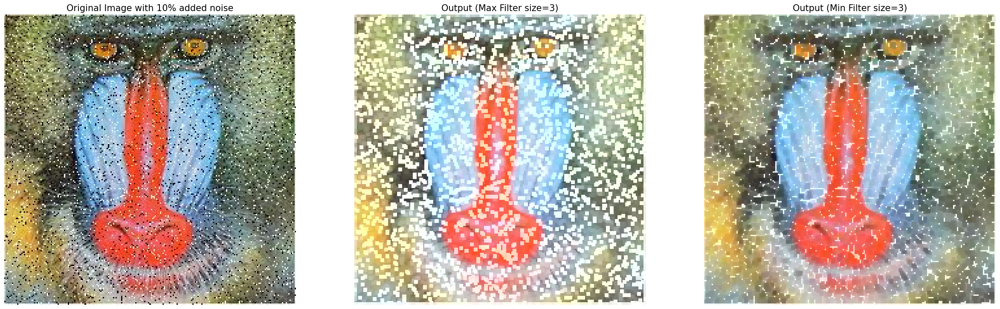

In [96]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
pylab.figure(figsize=(30,10))
sz = 3
pylab.subplot(1,3,1)
plot_image(im, 'Original Image with 10% added noise')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
pylab.subplot(1,3,2), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im1 = im1.filter(ImageFilter.MinFilter(size=sz))
pylab.subplot(1,3,3), plot_image(im1, 'Output (Min Filter size=' + str(sz)+ ')')
pylab.show()